In [1]:
import cv2
import PIL
import numpy as np
from PIL import Image
from PIL.ExifTags import TAGS
from pprint import pprint
from ipywidgets import Video

In [2]:
def imshow(a):
    a = a.clip(0, 255).astype("uint8")
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(PIL.Image.fromarray(a))

In [29]:
template = cv2.imread("./fotos/cube.PNG", cv2.IMREAD_COLOR)

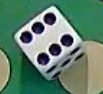

In [15]:
imshow(template)

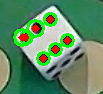

In [40]:
template = cv2.imread("./fotos/cube.PNG", cv2.IMREAD_COLOR)
gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

# Detect circles using Hough Circle Transform
circles = cv2.HoughCircles(
    blurred,
    cv2.HOUGH_GRADIENT,
    dp=1.2,  # Inverse ratio of accumulator resolution
    minDist=3,  # Minimum distance between detected circles
    param1=60,  # Higher threshold for edge detection
    param2=15,  # Threshold for center detection
    minRadius=3,  # Minimum circle radius
    maxRadius=10   # Maximum circle radius
)

# If circles are detected, draw them
if circles is not None:
    circles = np.uint16(np.around(circles))
    for circle in circles[0, :]:
        x, y, r = circle
        # Draw the outer circle
        cv2.circle(template, (x, y), r, (0, 255, 0), 2)
        # Draw the center of the circle
        cv2.circle(template, (x, y), 2, (0, 0, 255), 3)


imshow(template)

In [177]:
vv = cv2.VideoCapture("./videos/cube.avi")
if vv.isOpened():
    print("Video loaded")

vv_width = int(vv.get(3))
vv_height = int(vv.get(4))

print(vv_height, vv_width)

vv_fps = vv.get(cv2.CAP_PROP_FPS)
print(vv_fps)

free_kick_track = cv2.VideoWriter(
    "./cube_with_dots.avi",
    cv2.VideoWriter_fourcc(*"DIVX"),
    vv_fps,
    (vv_width, vv_height),
)
# vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
step = 0
avg_count = 0
flag = True
while vv.isOpened():
    # if flag:
    step+=1
    ret, frame = vv.read()
    if ret:
        blurred = cv2.GaussianBlur(frame,(3,3),cv2.BORDER_DEFAULT)
        adjusted = cv2.convertScaleAbs(blurred, 1.5)
        img2gray = cv2.cvtColor(adjusted, cv2.COLOR_BGR2GRAY)
        ret,thresh1 = cv2.threshold(img2gray,200,255,cv2.THRESH_BINARY)
        # imshow(blurred_t)
        blurred_t = cv2.GaussianBlur(thresh1,(3,3),cv2.BORDER_DEFAULT)
        circles = cv2.HoughCircles(
            blurred_t,
            cv2.HOUGH_GRADIENT,
            dp=1.2,  # Inverse ratio of accumulator resolution
            minDist=5,  # Minimum distance between detected circles
            param1=60,  # Higher threshold for edge detection
            param2=10,  # Threshold for center detection
            minRadius=3,  # Minimum circle radius
            maxRadius=6   # Maximum circle radius
        )
        # if step % 20 == 0:
        #     print("average dots: {}".format(round(avg_count/20,0)))
        #     avg_count = 0

        # If circles are detected, draw them
        if circles is not None:
           
            circles = np.uint16(np.around(circles))
            count = 0
            for circle in circles[0, :]:
                if flag == False:
                    flag = True
                x, y, r = circle
                # Draw the outer circle
                cv2.circle(frame, (x, y), r, (0, 255, 0), 2)
                # Draw the center of the circle
                cv2.circle(frame, (x, y), 2, (0, 0, 255), 3)
                count += 1
            # print("\nDots number: {}".format(count))
            # imshow(frame)
        # if step == 200:
        #     break
        free_kick_track.write(frame)
    else:
        break

vv.release()
free_kick_track.release()


Video loaded
88 104
60.0


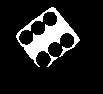

In [107]:
img = cv2.imread("./fotos/cube.PNG", cv2.IMREAD_COLOR)
blurred = cv2.GaussianBlur(img,(3,3),cv2.BORDER_DEFAULT)
adjusted = cv2.convertScaleAbs(blurred, 1.5)
img2gray = cv2.cvtColor(adjusted, cv2.COLOR_BGR2GRAY)
ret,thresh1 = cv2.threshold(img2gray,200,255,cv2.THRESH_BINARY)
imshow(thresh1)

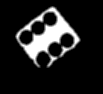

In [109]:
# tresh1 to grayscale
mask_cube = cv2.GaussianBlur(thresh1,(3,3),cv2.BORDER_DEFAULT)
imshow(mask_cube)


In [112]:
w, h = mask_cube.shape


Dots number: 6


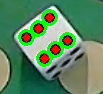

In [50]:
circles = cv2.HoughCircles(
            blurred,
            cv2.HOUGH_GRADIENT,
            dp=1.2,  # Inverse ratio of accumulator resolution
            minDist=2,  # Minimum distance between detected circles
            param1=50,  # Higher threshold for edge detection
            param2=15,  # Threshold for center detection
            minRadius=3,  # Minimum circle radius
            maxRadius=8   # Maximum circle radius
        )

# If circles are detected, draw them

if circles is not None:
    circles = np.uint16(np.around(circles))
    count = 0
    for circle in circles[0, :]:
        x, y, r = circle
        # Draw the outer circle
        cv2.circle(img, (x, y), r, (0, 255, 0), 2)
        # Draw the center of the circle
        cv2.circle(img, (x, y), 2, (0, 0, 255), 3)
        count += 1
    print("\nDots number: {}".format(count))
imshow(img)


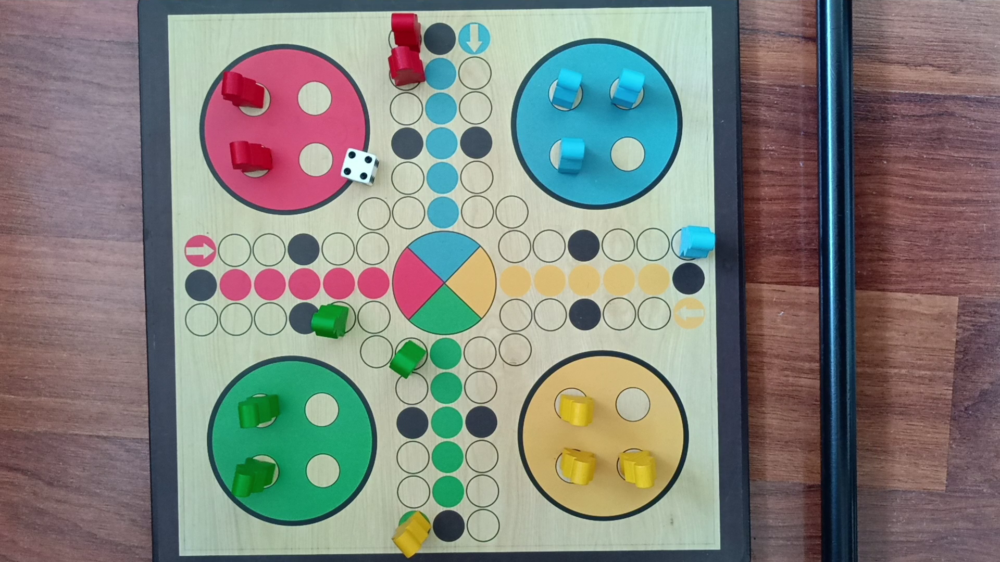

In [185]:
vv = cv2.VideoCapture("./videos/easy/gameplay1.mp4")
vv.set(cv2.CAP_PROP_POS_FRAMES, 1550)
frame_width = int(vv.get(3))
frame_height = int(vv.get(4))
ret, frame = vv.read()
imshow(frame)

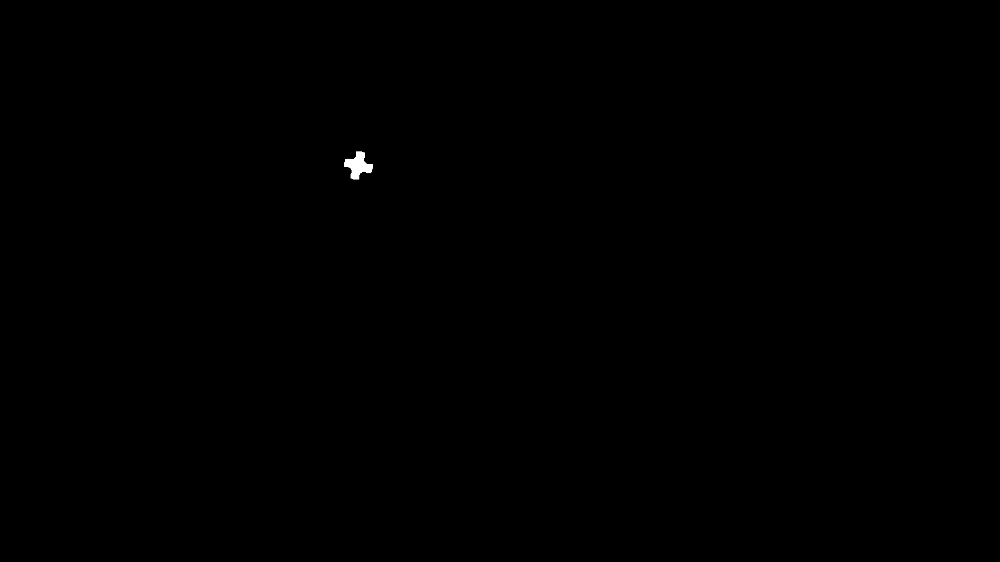

In [187]:
# img = cv2.imread("./fotos/cube.PNG", cv2.IMREAD_COLOR)
blurred = cv2.GaussianBlur(frame,(3,3),cv2.BORDER_DEFAULT)
adjusted = cv2.convertScaleAbs(blurred, 1.5)
img2gray = cv2.cvtColor(adjusted, cv2.COLOR_BGR2GRAY)
ret,thresh1 = cv2.threshold(img2gray,220,255,cv2.THRESH_BINARY)

kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(thresh1, cv2.MORPH_OPEN, kernel, iterations=2)
imshow(opening)

In [188]:

contours, _ = cv2.findContours(opening.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
pawn_boxes = []
min_pawn_area = (min(frame_width, frame_height) * 0.02)**2
max_pawn_area = (min(frame_width, frame_height) * 0.10)**2
for contour in contours:
    area = cv2.contourArea(contour)
    if min_pawn_area < area < max_pawn_area:
        pawn_boxes.append(cv2.boundingRect(contour))

print(f"Found {len(pawn_boxes)} pawns")
print(pawn_boxes[0])
pawn_box = list(pawn_boxes[0])
pawn_box[0]-=10
pawn_box[1]-=10
pawn_box[2]+=30
pawn_box[3]+=30


Found 1 pawns
(661, 291, 55, 54)


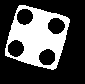

In [189]:
top_left = pawn_box[:2]
bottom_right = (top_left[0] + pawn_box[2], top_left[1] + pawn_box[3])
cube = thresh1[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
imshow(cube)

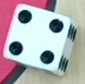

In [193]:
ff = frame[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
imshow(ff)

In [194]:
blurred_t = cv2.GaussianBlur(cube,(3,3),cv2.BORDER_DEFAULT)
circles = cv2.HoughCircles(
            blurred_t,
            cv2.HOUGH_GRADIENT,
            dp=1.2,  # Inverse ratio of accumulator resolution
            minDist=5,  # Minimum distance between detected circles
            param1=60,  # Higher threshold for edge detection
            param2=10,  # Threshold for center detection
            minRadius=6,  # Minimum circle radius
            maxRadius=10   # Maximum circle radius
        )
        # if step % 20 == 0:
        #     print("average dots: {}".format(round(avg_count/20,0)))
        #     avg_count = 0

        # If circles are detected, draw them
if circles is not None:
           
            circles = np.uint16(np.around(circles))
            count = 0
            for circle in circles[0, :]:
                if flag == False:
                    flag = True
                x, y, r = circle
                # Draw the outer circle
                cv2.circle(ff, (x, y), r, (0, 255, 0), 2)
                # Draw the center of the circle
                cv2.circle(ff, (x, y), 2, (0, 0, 255), 3)

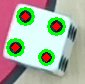

In [195]:
imshow(ff)

In [174]:
len(circles[0, :])

2

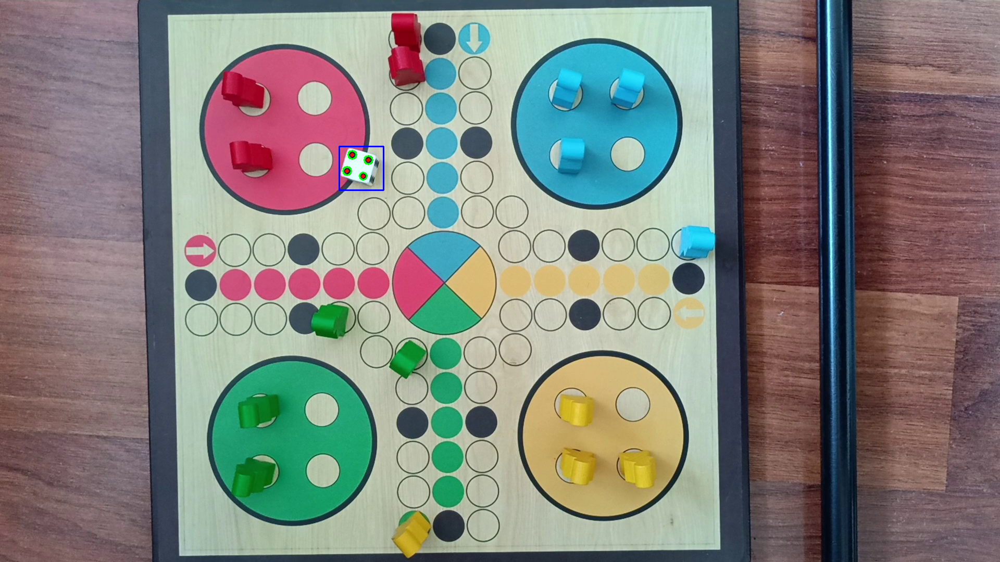

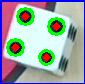

In [196]:
   
top_left = pawn_box[:2]
bottom_right = (top_left[0] + pawn_box[2], top_left[1] + pawn_box[3])
cv2.rectangle(frame, top_left, bottom_right, (255, 0, 0), 2)
imshow(frame)


# crop the image
pawn = frame[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
imshow(pawn)

In [198]:
vv = cv2.VideoCapture("./videos/easy/gameplay1.mp4")
if vv.isOpened():
    print("Video loaded")

vv_width = int(vv.get(3))
vv_height = int(vv.get(4))

print(vv_height, vv_width)

vv_fps = vv.get(cv2.CAP_PROP_FPS)
print(vv_fps)

free_kick_track = cv2.VideoWriter(
    "./cube_with_dots_test_1.avi",
    cv2.VideoWriter_fourcc(*"DIVX"),
    vv_fps,
    (vv_width, vv_height),
)
# vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
step = 0
avg_count = 0
flag = True
while vv.isOpened():
    # if flag:
    step+=1
    ret, frame = vv.read()
    if ret:
        blurred = cv2.GaussianBlur(frame,(3,3),cv2.BORDER_DEFAULT)
        adjusted = cv2.convertScaleAbs(blurred, 1.5)
        img2gray = cv2.cvtColor(adjusted, cv2.COLOR_BGR2GRAY)
        ret,thresh1 = cv2.threshold(img2gray,220,255,cv2.THRESH_BINARY)

        kernel = np.ones((5, 5), np.uint8)
        opening = cv2.morphologyEx(thresh1, cv2.MORPH_OPEN, kernel, iterations=2)
        contours, _ = cv2.findContours(opening.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        pawn_boxes = []
        min_pawn_area = (min(frame_width, frame_height) * 0.02)**2
        max_pawn_area = (min(frame_width, frame_height) * 0.10)**2
        for contour in contours:
            area = cv2.contourArea(contour)
            if min_pawn_area < area < max_pawn_area:
                pawn_boxes.append(cv2.boundingRect(contour))

        # print(f"Found {len(pawn_boxes)} pawns")
        # print(pawn_boxes[0])
        top_left = pawn_box[:2]
        bottom_right = (top_left[0] + pawn_box[2], top_left[1] + pawn_box[3])
        cube = thresh1[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
        ff = frame[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
        if len(pawn_boxes) == 0:
            free_kick_track.write(ff)
            continue
        pawn_box = list(pawn_boxes[0])
        pawn_box[0]-=10
        pawn_box[1]-=10
        pawn_box[2]+=30
        pawn_box[3]+=30
        
        # imshow(blurred_t)
        blurred_t = cv2.GaussianBlur(cube,(3,3),cv2.BORDER_DEFAULT)
        circles = cv2.HoughCircles(
            blurred_t,
            cv2.HOUGH_GRADIENT,
            dp=1.2,  # Inverse ratio of accumulator resolution
            minDist=5,  # Minimum distance between detected circles
            param1=60,  # Higher threshold for edge detection
            param2=10,  # Threshold for center detection
            minRadius=6,  # Minimum circle radius
            maxRadius=10   # Maximum circle radius
        )
        # top_left = pawn_box[:2]
        # bottom_right = (top_left[0] + pawn_box[2], top_left[1] + pawn_box[3])
        # cv2.rectangle(frame, top_left, bottom_right, (255, 0, 0), 2)
        
        # if step % 20 == 0:
        #     print("average dots: {}".format(round(avg_count/20,0)))
        #     avg_count = 0

        # If circles are detected, draw them
        if circles is not None:
           
            circles = np.uint16(np.around(circles))
            count = 0
            for circle in circles[0, :]:
                if flag == False:
                    flag = True
                x, y, r = circle
                # Draw the outer circle
                cv2.circle(ff, (x, y), r, (0, 255, 0), 2)
                # Draw the center of the circle
                cv2.circle(ff, (x, y), 2, (0, 0, 255), 3)
                count += 1
            # print("\nDots number: {}".format(count))
            # imshow(frame)
        # if step == 200:
        #     break
        free_kick_track.write(ff)
    else:
        break

vv.release()
free_kick_track.release()


Video loaded
1080 1920
29.870918497719018
Found 15 pawns
(1333, 378, 30, 42)
Found 17 pawns
(1100, 402, 20, 32)
Found 17 pawns
(1337, 404, 25, 47)
Found 17 pawns
(1336, 404, 25, 47)
Found 17 pawns
(1336, 404, 25, 46)
Found 15 pawns
(1334, 379, 29, 72)
Found 16 pawns
(1335, 378, 28, 74)
Found 17 pawns
(1100, 402, 21, 29)
Found 18 pawns
(1100, 402, 21, 29)
Found 15 pawns
(1099, 402, 23, 42)
Found 17 pawns
(1099, 402, 23, 42)
Found 16 pawns
(1100, 402, 22, 30)
Found 12 pawns
(1100, 402, 22, 30)
Found 14 pawns
(641, 334, 79, 81)
Found 14 pawns
(641, 334, 79, 81)
Found 14 pawns
(665, 332, 55, 83)
Found 13 pawns
(654, 332, 66, 83)
Found 13 pawns
(678, 332, 42, 51)
Found 13 pawns
(678, 332, 42, 50)
Found 13 pawns
(678, 332, 42, 50)
Found 12 pawns
(678, 332, 42, 50)
Found 12 pawns
(678, 332, 42, 50)
Found 13 pawns
(1333, 379, 30, 73)
Found 13 pawns
(1333, 379, 30, 73)
Found 12 pawns
(1333, 379, 30, 72)
Found 12 pawns
(1333, 379, 30, 72)
Found 12 pawns
(1333, 379, 30, 72)
Found 12 pawns
(1332, 

IndexError: list index out of range

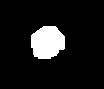

In [200]:
template = cv2.imread("./fotos/mask.PNG", cv2.IMREAD_COLOR)
_, w, h = template.shape[::-1]
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
_, thresh_template = cv2.threshold(gray_template, 225, 255, cv2.THRESH_BINARY)
imshow(thresh_template)

In [203]:
vv = cv2.VideoCapture("./videos/easy/gameplay1.mp4")
if vv.isOpened():
    print("Video loaded")

vv_width = int(vv.get(3))
vv_height = int(vv.get(4))

print(vv_height, vv_width)

vv_fps = vv.get(cv2.CAP_PROP_FPS)
print(vv_fps)

template = cv2.imread("./fotos/mask.PNG", cv2.IMREAD_COLOR)
_, w, h = template.shape[::-1]
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
_, thresh_template = cv2.threshold(gray_template, 225, 255, cv2.THRESH_BINARY)

free_kick_track = cv2.VideoWriter(
    "./cube_detect_with_circle.avi",
    cv2.VideoWriter_fourcc(*"DIVX"),
    vv_fps,
    (vv_width, vv_height),
)
# vv.set(cv2.CAP_PROP_POS_FRAMES, 200)
step = 0
avg_count = 0
flag = True
while vv.isOpened():
    # if flag:
    step+=1
    ret, frame = vv.read()
    if ret:
        blurred = cv2.GaussianBlur(frame,(3,3),cv2.BORDER_DEFAULT)
        adjusted = cv2.convertScaleAbs(blurred, 1.5)
        img2gray = cv2.cvtColor(adjusted, cv2.COLOR_BGR2GRAY)
        ret,thresh1 = cv2.threshold(img2gray,220,255,cv2.THRESH_BINARY)
        kernel = np.ones((5, 5), np.uint8)
        opening = cv2.morphologyEx(thresh1, cv2.MORPH_OPEN, kernel, iterations=2)
        op_frame = opening.copy()

       
        _pleng = op_frame.copy()
        # Apply template Matching
        res = cv2.matchTemplate(_pleng, thresh_template, cv2.TM_CCOEFF)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
       
        top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        

        # crop the detected cube
        cube = thresh1[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]

        blurred_t = cv2.GaussianBlur(cube,(3,3),cv2.BORDER_DEFAULT)
        circles = cv2.HoughCircles(
            blurred_t,
            cv2.HOUGH_GRADIENT,
            dp=1.2,  # Inverse ratio of accumulator resolution
            minDist=5,  # Minimum distance between detected circles
            param1=60,  # Higher threshold for edge detection
            param2=10,  # Threshold for center detection
            minRadius=6,  # Minimum circle radius
            maxRadius=10   # Maximum circle radius
        )

        if circles is not None:      
            circles = np.uint16(np.around(circles))
            count = 0
            for circle in circles[0, :]:
                if flag == False:
                    flag = True
                x, y, r = circle
                # Draw the outer circle
                # cv2.circle(ff, (x, y), r, (0, 255, 0), 2)
                # Draw the center of the circle
                # cv2.circle(ff, (x, y), 2, (0, 0, 255), 3)
                count += 1
            
            cv2.rectangle(frame, top_left, bottom_right, (255, 0, 0), 2)
            # put text on the frame
            font = cv2.FONT_HERSHEY_SIMPLEX
            cv2.putText(frame, str(len(circles[0, :])), (top_left[0], top_left[1] - 10), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)
            
        if step == 1000:
            break

        free_kick_track.write(frame)
    else:
        break

vv.release()
free_kick_track.release()


Video loaded
1080 1920
29.870918497719018


Video loaded
1080 1920
29.870918497719018


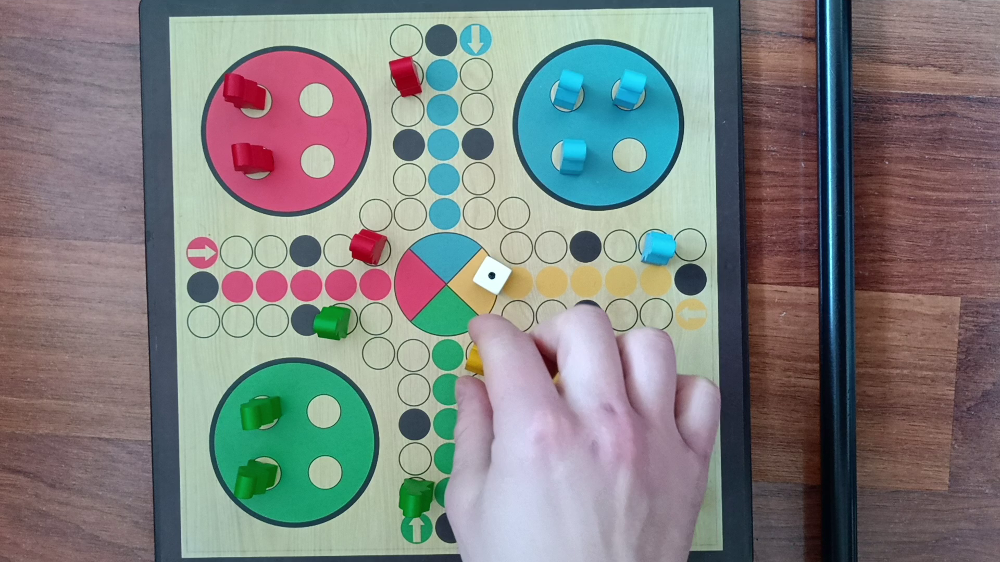

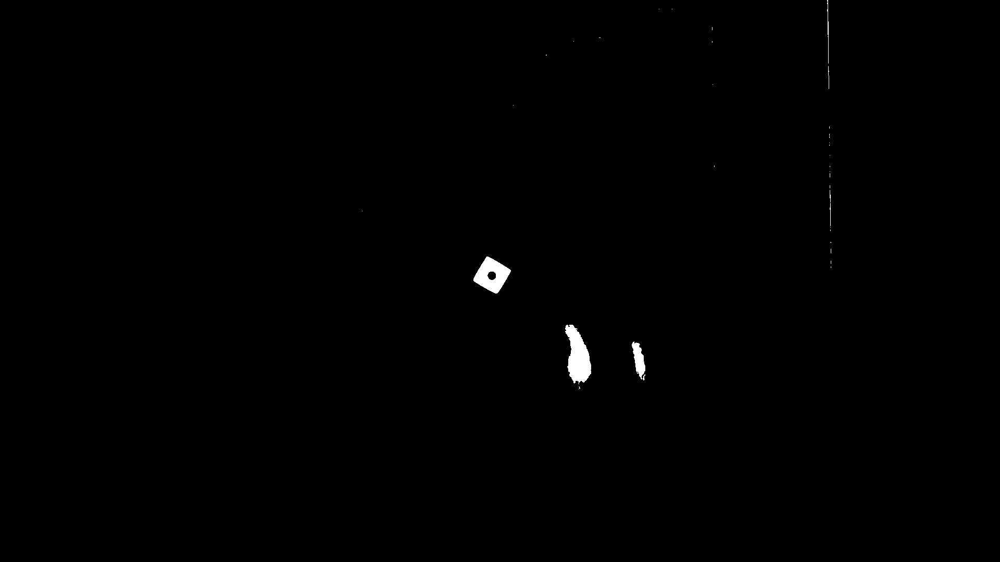

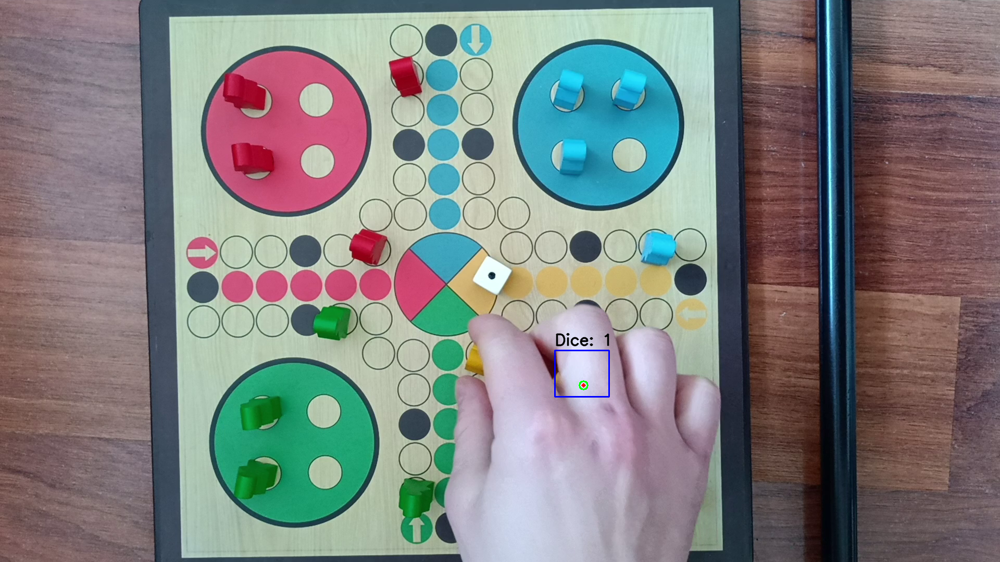

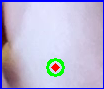

In [219]:
vv = cv2.VideoCapture("./videos/easy/gameplay1.mp4")
if vv.isOpened():
    print("Video loaded")

vv.set(cv2.CAP_PROP_POS_FRAMES, 100)

vv_width = int(vv.get(3))
vv_height = int(vv.get(4))

print(vv_height, vv_width)

vv_fps = vv.get(cv2.CAP_PROP_FPS)
print(vv_fps)

template = cv2.imread("./fotos/mask.PNG", cv2.IMREAD_COLOR)
_, w, h = template.shape[::-1]
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
_, thresh_template = cv2.threshold(gray_template, 225, 255, cv2.THRESH_BINARY)


ret, frame = vv.read()
imshow(frame)


blurred = cv2.GaussianBlur(frame,(3,3),cv2.BORDER_DEFAULT)
adjusted = cv2.convertScaleAbs(blurred, 1.5)
img2gray = cv2.cvtColor(adjusted, cv2.COLOR_BGR2GRAY)
ret,thresh1 = cv2.threshold(img2gray,220,255,cv2.THRESH_BINARY)
imshow(thresh1)
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(thresh1, cv2.MORPH_OPEN, kernel, iterations=2)
op_frame = opening.copy()
_pleng = op_frame.copy()
# Apply template Matching
res = cv2.matchTemplate(_pleng, thresh_template, cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
# If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
top_left = max_loc
bottom_right = (top_left[0] + w, top_left[1] + h)

# crop the detected cube
cube = thresh1[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
blurred_t = cv2.GaussianBlur(cube,(3,3),cv2.BORDER_DEFAULT)
circles = cv2.HoughCircles(
    blurred_t,
    cv2.HOUGH_GRADIENT,
    dp=1.2,  # Inverse ratio of accumulator resolution
    minDist=10,  # Minimum distance between detected circles
    param1=60,  # Higher threshold for edge detection
    param2=10,  # Threshold for center detection
    minRadius=6,  # Minimum circle radius
    maxRadius=10   # Maximum circle radius
)
ff = frame[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
if circles is not None:      
    circles = np.uint16(np.around(circles))
    count = 0
    for circle in circles[0, :]:
        if flag == False:
            flag = True
        x, y, r = circle
        # Draw the outer circle
        cv2.circle(ff, (x, y), r, (0, 255, 0), 2)
        # Draw the center of the circle
        cv2.circle(ff, (x, y), 2, (0, 0, 255), 3)
        count += 1
    
    cv2.rectangle(frame, top_left, bottom_right, (255, 0, 0), 2)
    # put text on the frame
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(frame, 'Dice: '+str(len(circles[0, :])), (top_left[0], top_left[1] - 10), font, 1, (0, 0, 0), 2, cv2.LINE_AA)
imshow(frame)
imshow(ff)